In [155]:
# importamos las librerias:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from wordcloud import WordCloud  
from nltk.corpus import stopwords  
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec

In [2]:
# leemos el dataset: 
df = pd.read_csv('Datasets/AccidentesAviones.csv')

#  ETL

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5008 entries, 0 to 5007
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Unnamed: 0              5008 non-null   int64 
 1   fecha                   5008 non-null   object
 2   HORA declarada          5008 non-null   object
 3   Ruta                    5008 non-null   object
 4   OperadOR                5008 non-null   object
 5   flight_no               5008 non-null   object
 6   route                   5008 non-null   object
 7   ac_type                 5008 non-null   object
 8   registration            5008 non-null   object
 9   cn_ln                   5008 non-null   object
 10  all_aboard              5008 non-null   object
 11  PASAJEROS A BORDO       5008 non-null   object
 12  crew_aboard             5008 non-null   object
 13  cantidad de fallecidos  5008 non-null   object
 14  passenger_fatalities    5008 non-null   object
 15  crew

Los datos de las columnas son los siguientes:

    Unnamed: 0 : columna de indices
    fecha : fecha registrada del accidente
    HORA declarada : hora del accidente
    Ruta : lugar del accidente
    OperadOR : aerolinea involucrada en el accidente 
    flight_no : número de vuelo asignado por el operador
    route : ruta de vuelo parcial o anterior al accidente
    ac_type : tipo de aeronave
    registration : código ICAO de registro de la aeronave
    cn_ln : número de construcción o número serial
    all_aboard : total de personas abordo del vuelo
    PASAJEROS A BORDO : total de pasajeros abordo del vuelo
    crew_aboard : número de miembros de la tripulación del avión
    cantidad de fallecidos : total de fallecidos del vuelo
    passenger_fatalities : total de fallecidos pasajeros
    crew_fatalities : total de fallecidos que eran tripulación
    ground : número de fallecidos en tierra
    summary : resumen del accidente

In [4]:
df.head()

,Unnamed: 0,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,?,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,SC1,?,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,?,?,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,?,?,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),?,?,20,?,?,14,?,?,0,The airship flew into a thunderstorm and encou...


In [5]:
# vamos a renombrar columnas para poder entenderlas mejor, mantendré el inglés
# vemos los nombres de las columnas actuales:
columnas_actuales = df.columns
columnas_actuales

Index(['Unnamed: 0', 'fecha', 'HORA declarada', 'Ruta', 'OperadOR',
       'flight_no', 'route', 'ac_type', 'registration', 'cn_ln', 'all_aboard',
       'PASAJEROS A BORDO', 'crew_aboard', 'cantidad de fallecidos',
       'passenger_fatalities', 'crew_fatalities', 'ground', 'summary'],
      dtype='object')

In [6]:
# creamos un diccionario para renombrear:
renombrar = {
    'Unnamed: 0': 'id',
    'HORA declarada': 'hora',
    'Ruta': 'locacion',
    'OperadOR': 'operator',
    'flight_no': 'flight',
    'PASAJEROS A BORDO': 'passengers_aboard',
    'cantidad de fallecidos': 'fatalities',
    'ground': 'ground_fatalities',
}

df.rename(columns=renombrar, inplace= True)

# chequeamos los nuevos nombres:
columnas_transformadas = df.columns
columnas_transformadas

Index(['id', 'fecha', 'hora', 'locacion', 'operator', 'flight', 'route',
       'ac_type', 'registration', 'cn_ln', 'all_aboard', 'passengers_aboard',
       'crew_aboard', 'fatalities', 'passenger_fatalities', 'crew_fatalities',
       'ground_fatalities', 'summary'],
      dtype='object')

In [7]:
# vamos a ver los valores unicos por columna, para darnos una idea de la heterogeneidad o no de los datos
df.nunique()

id                      5008
fecha                   4577
hora                    1217
locacion                4125
operator                2268
flight                   893
route                   3839
ac_type                 2469
registration            4701
cn_ln                   3908
all_aboard               245
passengers_aboard        235
crew_aboard               35
fatalities               200
passenger_fatalities     191
crew_fatalities           29
ground_fatalities         52
summary                 4858
dtype: int64

In [8]:
# identificamos que hay varias filas con valores "?", asi que vamos a reemplazar los valores "?" por NaN (valores nulos) donde aparezca
df.replace("?", np.nan, inplace=True)

# chequeamos de nuevo los nulos:
df.isnull().sum()

id                         0
fecha                      0
hora                    1504
locacion                   5
operator                  10
flight                  3682
route                    762
ac_type                   13
registration             272
cn_ln                    667
all_aboard                17
passengers_aboard        221
crew_aboard              219
fatalities                 8
passenger_fatalities     235
crew_fatalities          235
ground_fatalities         44
summary                   59
dtype: int64

In [9]:
# vamos a mirar los porcentajes de nulos
nulos = 100 * df.isnull().sum()/len(df)
nulos

id                       0.000000
fecha                    0.000000
hora                    30.031949
locacion                 0.099840
operator                 0.199681
flight                  73.522364
route                   15.215655
ac_type                  0.259585
registration             5.431310
cn_ln                   13.318690
all_aboard               0.339457
passengers_aboard        4.412939
crew_aboard              4.373003
fatalities               0.159744
passenger_fatalities     4.692492
crew_fatalities          4.692492
ground_fatalities        0.878594
summary                  1.178115
dtype: float64

In [10]:
# elijo no seguir con estas columnas ya que tienen muchos nulos y el contenido no es relevante para el analisis
df = df.drop('flight', axis = 1)
df = df.drop('cn_ln', axis = 1)

con estos pequeños ajustes vamos a realizar un scaneo con pandas profiling para observar rapidamente que hay dentro del dataset:

In [11]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

empezamos a explorar algunas columnas para solucionar o mejorar la calidad de los datos, empezamos con:
- 'fecha': mejorando su formato a DD-MM-AAAA

In [12]:
df.head(5)

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
0,0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,NaN,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,"September 07, 1909",NaN,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,SC1,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,NaN,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,"August 06, 1913",NaN,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,NaN,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),NaN,20,NaN,NaN,14,NaN,NaN,0,The airship flew into a thunderstorm and encou...


In [13]:
# convertir 'fecha' a formato de fecha
df['fecha'] = pd.to_datetime(df['fecha'])

# verificar el nuevo formato de fecha
print(df['fecha'].head())

# verificar los tipos de datos resultantes
print(df.dtypes)

0   1908-09-17
1   1909-09-07
2   1912-07-12
3   1913-08-06
4   1913-09-09
Name: fecha, dtype: datetime64[ns]
id                               int64
fecha                   datetime64[ns]
hora                            object
locacion                        object
operator                        object
route                           object
ac_type                         object
registration                    object
all_aboard                      object
passengers_aboard               object
crew_aboard                     object
fatalities                      object
passenger_fatalities            object
crew_fatalities                 object
ground_fatalities               object
summary                         object
dtype: object


ahora la columna:
- 'hora': tiene caracteres que no pertenecen a una hora y le falta formato, pareciera estar en horario militar

In [15]:
# reemplazar los valores nulos por 0
df['hora'] = df['hora'].fillna(0)

# convertir la columna 'hora' a tipo numérico
df['hora'] = pd.to_numeric(df['hora'], errors='coerce')

# convertir la columna 'hora' a formato hh:mm
df['hora'] = df['hora'].apply(lambda x: '{:02d}:{:02d}'.format(int(x // 100), int(x % 100)))

# mostrar las primeras 10 filas de la columna 'hora'
print(df['hora'].head(10))

0    17:18
1    00:00
2    06:30
3    00:00
4    18:30
5    10:30
6    01:00
7    15:20
8    00:00
9    01:00
Name: hora, dtype: object


In [16]:
# revisamos los cambios
df.tail()

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
5003,5003,2021-03-28,18:35,"Near Butte, Alaska",Soloy Helicopters,Sightseeing Charter,Eurocopter AS350B3 Ecureuil,N351SH,6,5,1,5,4,1,0,The sightseeing helicopter crashed after missi...
5004,5004,2021-05-21,18:00,"Near Kaduna, Nigeria",Military - Nigerian Air Force,NaN,Beechcraft B300 King Air 350i,NAF203,11,7,4,11,7,4,0,"While on final approach, in poor weather condi..."
5005,5005,2021-06-10,08:00,"Near Pyin Oo Lwin, Myanmar",Military - Myanmar Air Force,Naypyidaw - Anisakan,Beechcraft 1900D,4610,14,12,2,12,11,1,0,The plane was carrying military personnel and ...
5006,5006,2021-07-04,00:00,"Patikul, Sulu, Philippines",Military - Philippine Air Force,Cagayan de Oro-Lumbia - Jolo,Lockheed C-130H Hercules,5125,96,88,8,50,NaN,NaN,3,"While attempting to land at Jolo Airport, the ..."
5007,5007,2021-07-06,15:00,"Palana, Russia",Kamchatka Aviation Enterprise,Petropavlovsk - Palana,Antonov An 26B-100,RA-26085,28,22,6,28,22,6,0,The passenger plane crashed into the top of a ...


seguimos ordenando el dataset, ahora revisaremos:
- 'location'

In [17]:
# vemos la cantidad de nulos y luego los imprimimos para ver el contenido de la fila
df['locacion'].isnull().sum()


5

In [18]:
loc_nulls = df[df['locacion'].isnull()]
loc_nulls

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
360,360,1934-12-31,00:00,NaN,Aeroflot,NaN,Tupolev ANT-9,NaN,10,8,2,10,8,2,0,Crashed under unknown circumstances.
465,465,1937-06-20,00:00,NaN,ENTA,San José San Isidro de El General,Travel Air 6000,TI-3,6,5,1,6,5,1,NaN,Hit trees and crashed in an isolated area loca...
646,646,1942-08-21,00:00,NaN,Deutsche Lufthansa,NaN,Siebel Si-204,NaN,4,2,2,4,2,2,0,"Lufthansa chairman, Von Gablenz killed."
999,999,1947-11-27,00:00,NaN,China National Aviation Corporation,NaN,Douglas DC-3,NaN,3,0,3,2,0,2,0,The cargo plane was shot down by communist ant...
2895,2895,1977-01-20,00:00,NaN,North Canada Air,NaN,Bristol 170 Freighter 31M,C-FWAD,2,0,2,1,0,1,0,The cargo plane stalled nearly vertical and cr...


        los nulos son pocos y las filas contienen datos importantes, asi que voy a optar por clasificar los nulos como 'desconocido'

In [19]:
# Reemplazar los valores nulos por 0
df['locacion'] = df['locacion'].fillna('desconocido')

ahora revisaremos:
- 'operator'

In [20]:
# revisamos la cantidad de nulos
df['operator'].isnull().sum()

10

In [21]:
# vemos el contenido de las filas donde hay nulos
operator_nulls = df[df['operator'].isnull()]
operator_nulls

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,SC1,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
17,17,1917-06-17,00:00,"Near Yarmouth, England",NaN,NaN,Zepplin L-48 (air ship),L-48,16,NaN,NaN,14,NaN,NaN,0,Shot down by aircraft.
67,67,1922-04-08,00:00,"Pao Ting Fou, China",NaN,Test,NaN,NaN,17,0,17,17,0,17,0,Aboard were all workers taking part in a fligh...
69,69,1922-07-04,00:00,"Fuhlsbuttel, Germany",NaN,Hamburg - Berlin,LVG C VI,NaN,3,2,1,2,1,1,0,The passenger/mail plane lost it's engine whil...
114,114,1926-09-26,00:00,"New York, New York",NaN,New York - Paris,Sikorsky S-25,NaN,5,4,1,2,2,0,0,Too much weight caused the landing gear to col...
376,376,1935-05-29,00:00,"San Barbra, Honduras",NaN,NaN,NaN,NaN,9,NaN,NaN,6,NaN,NaN,0,Crashed into the Ulua River.
684,684,1943-07-04,23:00,Gibraltar,NaN,NaN,Consolidated Liberator B24 C,A-L-523,13,NaN,NaN,12,NaN,NaN,0,"The flight, bound for London, crashed into the..."
859,859,1946-04-08,00:00,"Near Shensi, China",NaN,Shensi - Yenan,NaN,NaN,14,11,3,14,11,3,0,NaN
2061,2061,1963-09-02,00:00,Northeast Laos,NaN,NaN,Curtiss C-46 Commando,NaN,16,13,3,15,12,3,NaN,Refugee flight.
4830,4830,2011-12-26,05:54,"Green Grove, Florida",NaN,"Jacksonville, FL - Gainsville, FL",Bell 206B,N5016M,3,2,1,3,2,1,0,The on-demand air taxi was on a flight to proc...


        los nulos son pocos y las filas contienen datos importantes, asi que voy a optar por clasificar los nulos como 'desconocido'

In [22]:
# Reemplazar los valores nulos por desconocido
df['operator'] = df['operator'].fillna('desconocido')

el turno de:
- 'route'

In [23]:
df['route'].isnull().sum()

762

In [24]:
#son muchos los nulos en este campo, asi que quiero ver si aportan o no real valor:
route_nulls = df[df['route'].isnull()]
route_nulls

,id,fecha,hora,locacion,operator,route,ac_type,registration,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,NaN,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),NaN,20,NaN,NaN,14,NaN,NaN,0,The airship flew into a thunderstorm and encou...
5,5,1913-10-17,10:30,"Near Johannisthal, Germany",Military - German Navy,NaN,Zeppelin L-2 (airship),NaN,28,NaN,NaN,28,NaN,NaN,0,Hydrogen gas which was being vented was sucked...
6,6,1915-03-05,01:00,"Tienen, Belgium",Military - German Navy,NaN,Zeppelin L-8 (airship),NaN,41,0,41,17,0,17,0,Crashed into trees while attempting to land af...
7,7,1915-09-03,15:20,"Off Cuxhaven, Germany",Military - German Navy,NaN,Zeppelin L-10 (airship),NaN,19,NaN,NaN,19,NaN,NaN,0,"Exploded and burned near Neuwerk Island, when..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,4842,2012-06-11,00:00,"Near Serov, Russia",Illegal flight,NaN,Antonov An-2R,RA-40312,13,12,1,13,12,1,0,The plane disappeared after being taken on an ...
4847,4847,2012-09-28,06:15,"Kathmandu, Nepal",Sita Air,NaN,Dornier 228-202,9N-AHA,19,16,3,19,16,3,0,The plane crash landed on the bank of the Mano...
4848,4848,2012-10-07,12:00,"Near Omdurman, Sudan",Military - Sudanese Air Force,NaN,Antonov An-12BP,ST-ASA,22,16,6,15,NaN,NaN,0,"The transport, carrying military personnel and..."
4878,4878,2013-11-29,20:25,Glasgow Scotland,Bond Air Services Ltd.,NaN,Eurocopter EC135 T2,G-SPAO,3,2,1,3,2,1,5,The police helicopter crashed into the roof of...


la columna 'route' presenta inconsistencias, muchos nulos, entradas erroneas, asi que opto por quitarla de mi dataset, al igual que 'registration' ya que no son datos que impacten en la mortalidad

In [25]:
df['registration'].isnull().sum()

272

In [26]:
df = df.drop('registration', axis=1)
df = df.drop('route', axis=1)

ahora para mi analisis de mortalidad necesito tener bien los datos que contengan información de numero de muertes/sobrevivientes, veo que hay varios nulos entre las columnas, voy a intentar rescatar todos los datos posibles en las columnas:
- 'all_aboard'
- 'passengers_aboard'
- 'crew_aborad'
- 'passengers_fatalities'
- 'crew_fatalities'
- 'fatalities'
- 'ground_fatalities'

In [27]:
# cuantos nulos hay en fatalities
df['fatalities'].isnull().sum()

8

In [28]:
# es un campo clave por lo que analizar las columnas con sus nulos nos ayuda a tomar decisiones
df[df.fatalities.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
103,103,1925-09-07,00:00,"Toul, France",CIDNA,Spad 33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
347,347,1934-08-10,00:00,"Ningbo, China",China National Aviation Corporation,Sikorsky S-38B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
384,384,1935-08-13,00:00,"Hangow, China",China National Aviation Corporation,Sikorsky S-38B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Destoryed in a storm.
451,451,1936-12-26,00:00,"Nanking, China",China National Aviation Corporation,Douglas DC-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
652,652,1942-10-01,00:00,"Kunming, China",China National Aviation Corporation,Douglas C-47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Crashed while attempting to land after losing ...
754,754,1944-11-09,00:00,"Seljord, Norway",Military - U.S. Army Air Corps,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
854,854,1946-03-18,00:00,"Between Chungking and Shanghai, China",China National Aviation Corporation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Disappeared while en route. Plane never located.
1451,1451,1954-03-13,00:00,"Dien Bien Phu, South Vietnam",Aigle Azur,C-46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shot down.


veo que no me van a servir los datos donde las fatalidades sean nulas asi que voy a eliminar esas filas ya qye no contienen ninguna informacion de mortalidad y no tengo otra forma de averiguarla porque el resto de las columnas tampoco tiene información

In [29]:
# dropeo las filas donde fatalities contiene nulos
df.dropna(subset= ['fatalities'], inplace=True)

In [30]:
# ahora vemos los nulos de 'all_aboard'
df['all_aboard'].isnull().sum()

9

In [31]:
df[df.all_aboard.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
26,26,1919-07-21,16:55,"Chicago, Illinois",Wingfoot Air Express Goodyear Tire,FD Type Dirigible,NaN,NaN,NaN,3,2,1,10,"The dirigible, cruising at 1,200 ft. caught fi..."
1231,1231,1951-01-20,00:00,"Huilyo, Peru",Military - TAM,Douglas DC-3,NaN,NaN,NaN,16,NaN,NaN,NaN,NaN
1362,1362,1952-12-22,00:00,"Damascus, Syria",Syrian Air,Douglas DC-3,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN
1386,1386,1953-04-10,00:00,"Near Anchieta Island, Brazil",REAL,Doublas Dc-3,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN
1577,1577,1956-06-13,00:00,Over North Carolina,Piedmont,Douglas DC-3,NaN,NaN,NaN,1,1,NaN,0,A passenger fell to his death after the door o...
1627,1627,1957-04-20,00:00,"Jirkouk, Iraq",Air France,Lockheed Super Constellation,NaN,NaN,NaN,1,1,0,0,Explosive decompression. A passenger was sucke...
1638,1638,1957-06-24,00:00,"Horn Island, Queensland, Australia",Adastra Airways,L-Hudson,NaN,NaN,NaN,6,NaN,NaN,NaN,Crashed on approach.
3553,3553,1989-05-09,00:00,"Near Tainjin, China",Aero Asahi,Bell 412,NaN,NaN,NaN,10,NaN,NaN,0,NaN
3752,3752,1992-02-20,00:00,En route from Argentina to California,Aerolineas Argentinas,Boeing B-747,NaN,NaN,NaN,1,NaN,NaN,0,A passenger died of cholera while en route.


veo que si bien tengo faltantes en 'all_aboard' puedo imputar esas filas, no son muchas y prefiero mantenerlas para no perder datos como lugares de accidentes, aerolineas, etc.

In [32]:
# necesito convertir a numerico para hacer operaciones
df['all_aboard'] = df['all_aboard'].fillna(0).astype(float)
df['crew_aboard'] = df['crew_aboard'].fillna(0).astype(float)
df['passengers_aboard'] = df['passengers_aboard'].fillna(0).astype(float)
df['passenger_fatalities'] = df['passenger_fatalities'].fillna(0).astype(float)
df['crew_fatalities'] = df['crew_fatalities'].fillna(0).astype(float)
df['ground_fatalities'] = df['ground_fatalities'].fillna(0).astype(float)
df['fatalities'] = df['fatalities'].fillna(0).astype(float)

In [33]:
# revisamos la cantidad de todo el personal abordo que tenga valor cero
df['all_aboard'][df['all_aboard']==0].count()

14

In [34]:
# sumamos los pasajeros y tripulantes, los agregamos a 'all_aboard'
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['passengers_aboard'] + df['crew_aboard'], df['all_aboard'])

# si sigue en 0, sumamos los numeros de las fatalidades y los agregamos a 'all_aboard'
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['passenger_fatalities'] + df['crew_fatalities'], df['all_aboard']) 

#si sigue dando 0 y en 'fatalities' hay informacion, agreamos 'all aboard' con ese numero aunque sea un aproximado
df['all_aboard'] = np.where(df['all_aboard'] == 0, df['fatalities'], df['all_aboard']) 

# revisamos la cantidad de todo el personal abordo que tenga valor cero
df['all_aboard'][df['all_aboard']==0].count()

2

In [35]:
# vemos esas 2 filas dondesigue habiendo 0
df[df['all_aboard']== 0]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
3144,3144,1981-09-22,00:00,"Near Babaeski, Turkey",Military - Turkish Air Force,Northrop F-5A,0.0,0.0,0.0,0.0,0.0,0.0,40.0,The fighter crashed into a village after the p...
3376,3376,1986-03-27,00:00,"Bangui, Central African Republic",Military - French Air Force,Sepecat Jaguar A,0.0,0.0,0.0,0.0,0.0,0.0,35.0,The jet fighter crashed into a school shortly ...


dado que los dos registros aportan datos de muertes en tierra y que con una simple busqueda en aviation-safety veo que ambos accidentes eran operados solo por 1 piloto, voy a llenar ambas filas con 1 en 'fatalities' y 'all_aboard' y las mantendré

In [36]:
df.loc[3376, 'all_aboard'] = 1
df.loc[3144, 'all_aboard'] = 1
df.loc[3144, 'fatalities'] = 1

In [37]:
df.loc[3144]

id                                                                   3144
fecha                                                 1981-09-22 00:00:00
hora                                                                00:00
locacion                                            Near Babaeski, Turkey
operator                                     Military - Turkish Air Force
ac_type                                                     Northrop F-5A
all_aboard                                                            1.0
passengers_aboard                                                     0.0
crew_aboard                                                           0.0
fatalities                                                            1.0
passenger_fatalities                                                  0.0
crew_fatalities                                                       0.0
ground_fatalities                                                    40.0
summary                 The fighter cr

In [38]:
df.isnull().sum()

id                       0
fecha                    0
hora                     0
locacion                 0
operator                 0
ac_type                 11
all_aboard               0
passengers_aboard        0
crew_aboard              0
fatalities               0
passenger_fatalities     0
crew_fatalities          0
ground_fatalities        0
summary                 55
dtype: int64

vamos a explorar:
- ac_type

In [39]:
df[df.ac_type.isna()]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary
67,67,1922-04-08,00:00,"Pao Ting Fou, China",desconocido,NaN,17.0,0.0,17.0,17.0,0.0,17.0,0.0,Aboard were all workers taking part in a fligh...
376,376,1935-05-29,00:00,"San Barbra, Honduras",desconocido,NaN,9.0,0.0,0.0,6.0,0.0,0.0,0.0,Crashed into the Ulua River.
624,624,1941-12-11,00:00,"Miami, Florida",Pan American Airways,NaN,3.0,0.0,0.0,3.0,0.0,0.0,0.0,NaN
701,701,1943-11-08,00:00,"Poona, India",Military - Indian Air Force,NaN,1.0,0.0,0.0,1.0,0.0,0.0,37.0,Crashed into a village.
796,796,1945-06-29,00:00,"Bangalore, India",Military - Royal Indian Air Force,NaN,2.0,0.0,0.0,2.0,0.0,0.0,36.0,Crashed into a village exploding and destoying...
853,853,1946-03-17,00:00,"Near Nanking, China",Military - Chinese Air Force,NaN,20.0,0.0,0.0,20.0,0.0,0.0,0.0,Crashed into mountainous terrain in low visibi...
859,859,1946-04-08,00:00,"Near Shensi, China",desconocido,NaN,14.0,11.0,3.0,14.0,11.0,3.0,0.0,NaN
1268,1268,1951-08-08,21:00,"Barilla Bay, Australia",Trans Australia Airlines,NaN,2.0,0.0,2.0,2.0,0.0,2.0,0.0,Cargo plane. Loss of lateral control during a ...
1318,1318,1952-03-26,00:00,"Moscow, Russia",Aeroflot,NaN,70.0,0.0,0.0,70.0,0.0,0.0,0.0,The plane overshot the runway and collided wit...
1924,1924,1961-11-22,00:00,"Harare, Zimbabwe",Rhodesian Air Services,NaN,3.0,0.0,3.0,3.0,0.0,3.0,0.0,The aircraft was on a charter flight to Living...


In [40]:
# Reemplazar los valores nulos por desconocido
df['ac_type'] = df['ac_type'].fillna('desconocido')

voy a crear una columna con el "año" del accidente para facilitar luego las visualizaciones:

In [41]:
#genero una columna de anio para que sean mas faciles las visualizaciones
df['anio'] = df['fecha'].dt.year

In [42]:
df.head()

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913


quiero hacer dos columnas con data: 
  1. si hay sobrevivientes en el accidente
  2. si % de sobrevivencia del accidente

In [43]:
# crear columna 'sobrevivientes' (SI o NO)
df['sobrevivientes'] = df.apply(lambda row: 'SI' if row['fatalities'] < row['all_aboard'] else 'NO', axis=1)

# crear columna '% de sobrevivientes'
df['porcentaje_sobrevivientes'] = (1 - (df['fatalities'] / df['all_aboard'])) * 100

# costrar las primeras 10 filas de las columnas 'sobrevivientes' y '% de sobrevivientes'
print(df[['sobrevivientes', 'porcentaje_sobrevivientes']].head(10))


  sobrevivientes  porcentaje_sobrevivientes
0             SI                  50.000000
1             NO                   0.000000
2             NO                   0.000000
3             NO                   0.000000
4             SI                  30.000000
5             NO                   0.000000
6             SI                  58.536585
7             NO                   0.000000
8             NO                   0.000000
9             NO                   0.000000


In [44]:
df.head(5)

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,sobrevivientes,porcentaje_sobrevivientes
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908,SI,50.0
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909,NO,0.0
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912,NO,0.0
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913,NO,0.0
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913,SI,30.0


voy a generar una columna con la cantidad de muertes tanto de la aeronave como en la tierra

In [45]:
df['total_fatalities'] = df['fatalities'] + df['ground_fatalities']
df.head()

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,sobrevivientes,porcentaje_sobrevivientes,total_fatalities
0,0,1908-09-17,17:18,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly...",1908,SI,50.0,1.0
1,1,1909-09-07,00:00,"Juvisy-sur-Orge, France",desconocido,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...,1909,NO,0.0,1.0
2,2,1912-07-12,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,1912,NO,0.0,5.0
3,3,1913-08-06,00:00,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...,1913,NO,0.0,1.0
4,4,1913-09-09,18:30,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.0,0.0,0.0,14.0,0.0,0.0,0.0,The airship flew into a thunderstorm and encou...,1913,SI,30.0,14.0


# EDA

%matplotlib inline

In [68]:
%matplotlib inline

###  nuevas columnas
A partir del dataset original se incluyeron las columnas:

    anio : año del accidente
    sobrevivientes: si el accidente tuvo sobrevivientes o no tuvo sobrevivientes
    porcentaje_sobrevivientes : el porcentaje de gente que sobrevivió
    total_fatalities : total de muertes, incluidas las de tierra


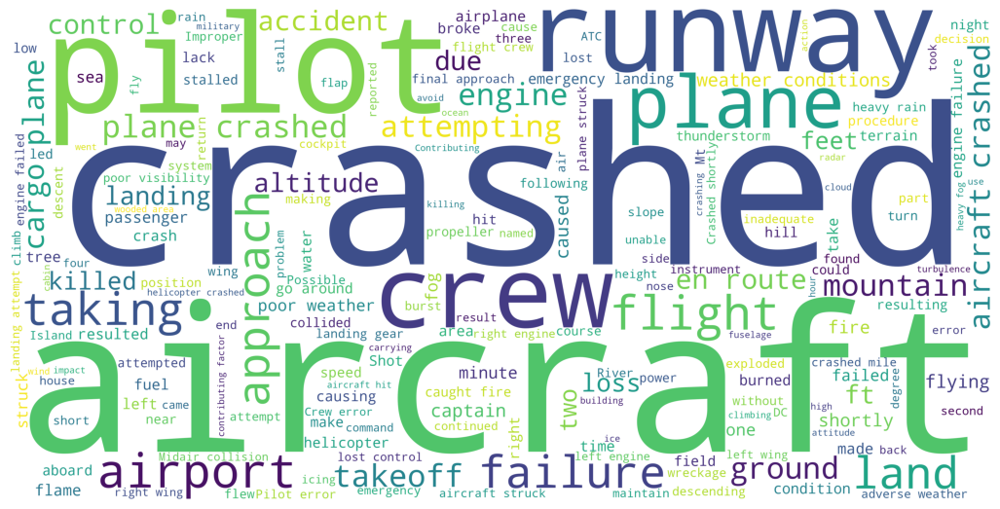

In [99]:
# graficare las palabras que mas se repiten en el titulo y en el overview, me aseguro que sean str
df['summary'] = df['summary'].astype('str')
# concatenar todos los resúmenes en una sola cadena de texto
text = ' '.join(df['summary'])
# crear la nube de palabras
stop = stopwords.words('english')
titulo_wordcloud = WordCloud(stopwords=stop, background_color='white', height=2000, width=4000).generate(text)

# graficar
plt.figure(figsize=(13, 8))
plt.imshow(titulo_wordcloud)
plt.axis('off')
plt.show()

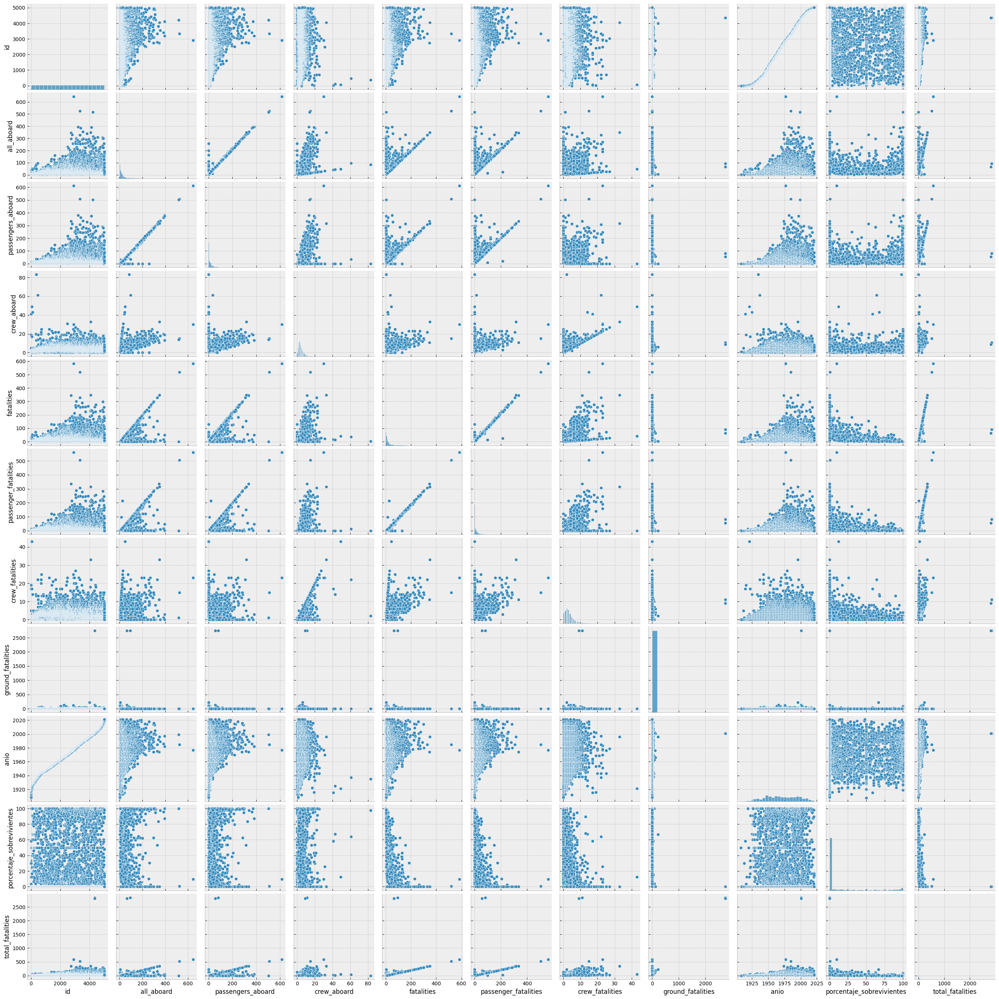

In [111]:
# hacemos un pairplot para conocer la relación entre las variables
sns.pairplot(data=df)

un dato que se destaca visualmente rapido es la correlacion entre la gente que aborda una aeronave y las muertes que se producen en el accidente, vamos a graficar la relación entre ambas

<Figure size 400x400 with 0 Axes>

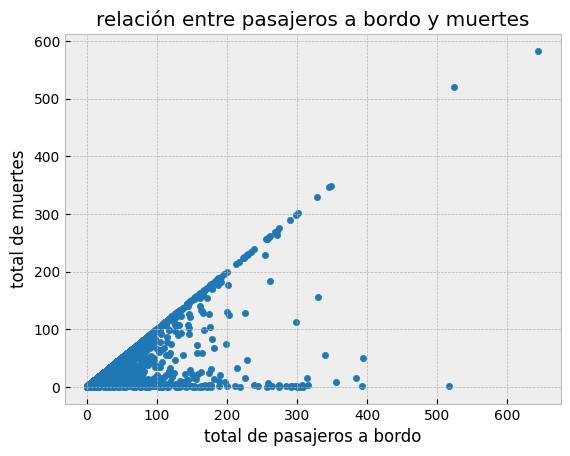

In [184]:
plt.figure(figsize=(4,4))
df.plot(x="all_aboard", y="fatalities", kind="scatter", color= 'tab:blue')
plt.xlabel("total de pasajeros a bordo")
plt.ylabel("total de muertes")
plt.title("relación entre pasajeros a bordo y muertes")

plt.show() 

podemos ver una entrecha relación entre las personas que suben a una aeronave y las personas que mueren cuando se produce un accidente

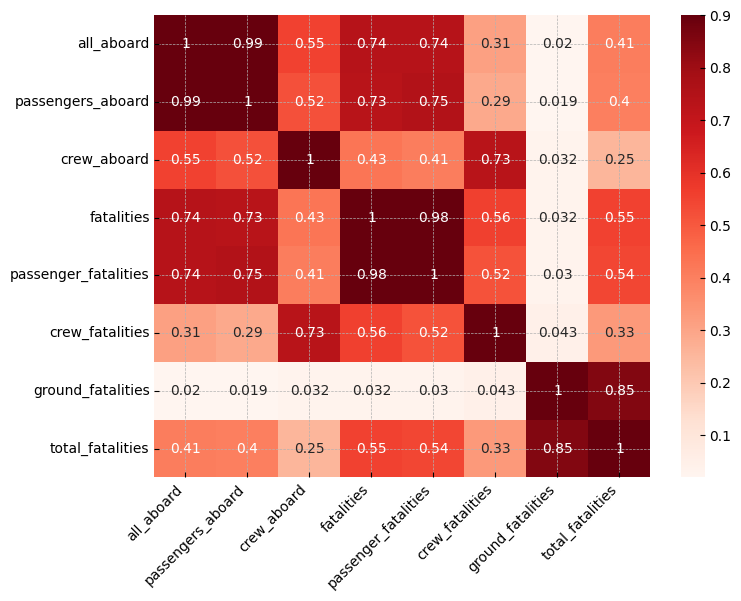

In [188]:
# graficamos las correlaciones con el mapa de correlaciones en Seaborn

corr = df[['all_aboard', 'passengers_aboard', 'crew_aboard', 'fatalities', 'passenger_fatalities', 'crew_fatalities', 'ground_fatalities', 'total_fatalities' ]].corr()
plt.subplots(figsize=(8,6))
heatmap = sns.heatmap(corr, annot=True, vmax=0.9, cmap="Reds")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.show()

vamos a visualizar los accidentes y las muertes a través de los años:

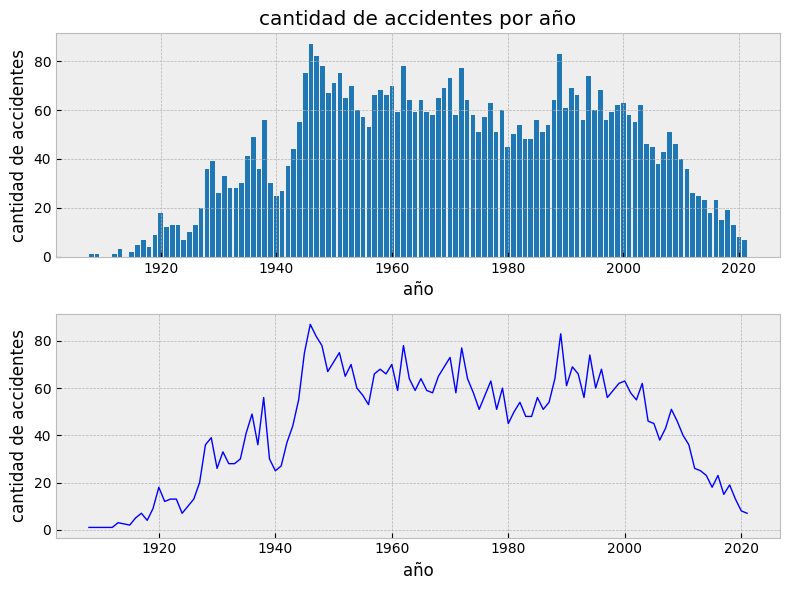

In [198]:
# contar la cantidad de accidentes por año
accidentes_por_ano = df['anio'].value_counts().sort_index()

# crear la figura y los subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

# gráfico 1: Cantidad de accidentes por año (gráfico de barras)
axs[0].bar(accidentes_por_ano.index, accidentes_por_ano.values, color='tab:blue')
axs[0].set_title('cantidad de accidentes por año')
axs[0].set_xlabel('año')
axs[0].set_ylabel('cantidad de accidentes')

# gráfico 2: Accidentes por año (gráfico de línea)
sns.lineplot(x=accidentes_por_ano.index, y=accidentes_por_ano.values, color='blue', linewidth=1, ax=axs[1])
axs[1].set_xlabel('año')
axs[1].set_ylabel('cantidad de accidentes')

# ajustar el espaciado entre los subplots
plt.tight_layout()

plt.show()

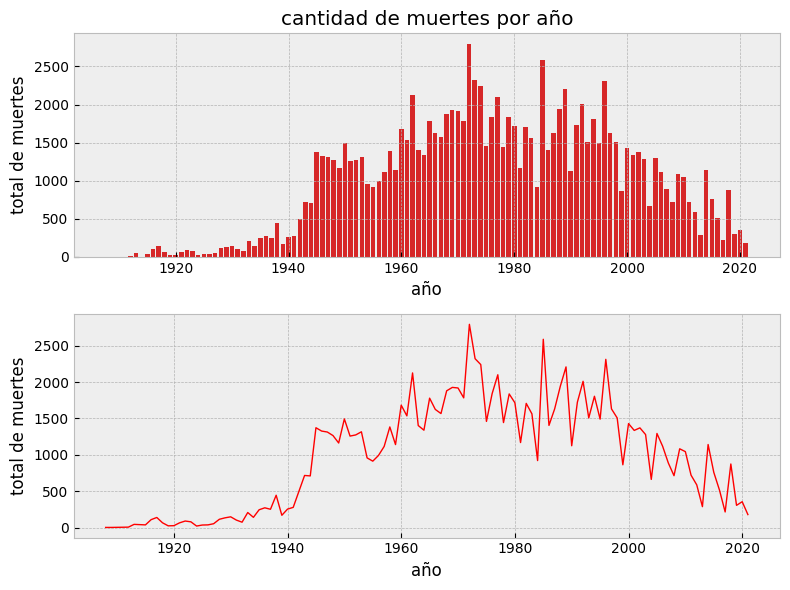

In [202]:
# contar las muertes por anio
muertes_por_ano = df[['anio','fatalities']].groupby('anio').agg(['sum','count'])

# crear la figura y los subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 6))

# gráfico 1: total de muertes por año (gráfico de barras)
axs[0].bar(muertes_por_ano.index, muertes_por_ano[('fatalities', 'sum')], color='tab:red')
axs[0].set_xlabel('año')
axs[0].set_ylabel('total de muertes')
axs[0].set_title('cantidad de muertes por año')

# gráfico 2: cantidad de muertes por año (gráfico de línea)
axs[1].plot(muertes_por_ano.index, muertes_por_ano[('fatalities', 'sum')], linewidth=1, color='red')
axs[1].set_xlabel('año')
axs[1].set_ylabel('total de muertes')

# ajustar el espaciado entre los subplots
plt.tight_layout()

plt.show()

vemos que hay una relación directa entre las muertes y los accidentes, así que vamos a ver ambos datos juntos:

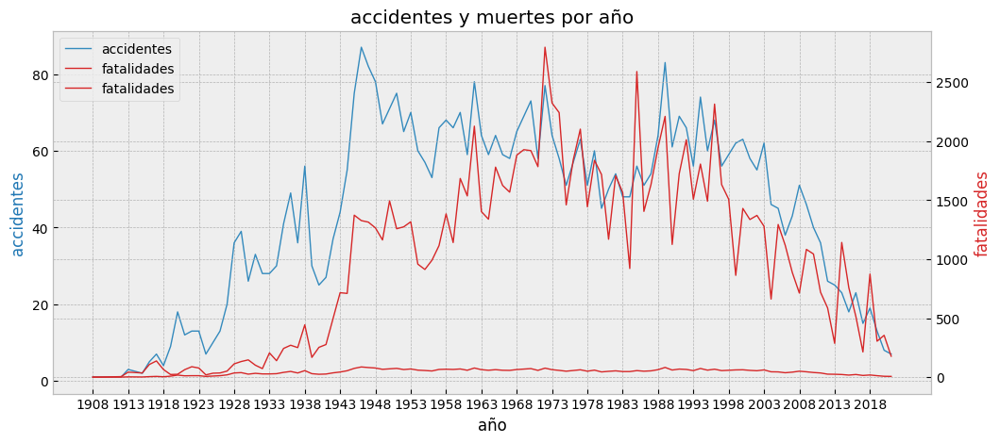

In [204]:
# Create figure and axes
fig, ax1 = plt.subplots(figsize=(12, 5))

# Plot crashes on left y-axis
ax1.plot(accidentes_por_ano.index, accidentes_por_ano.values, linewidth=1, label='accidentes')
ax1.set_xlabel('año')
ax1.set_ylabel('accidentes', color='tab:blue')
ax1.set_title('accidentes y muertes por año')

# Create a second y-axis for total fatalities
ax2 = ax1.twinx()

# Plot total fatalities on right y-axis with triangle marker
ax2.plot(muertes_por_ano.index, muertes_por_ano.values, linewidth=1, color='tab:red', label='fatalidades')
ax2.set_ylabel('fatalidades', color='tab:red')

# Combine the legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

# Set x-axis tick locations and labels
years = np.arange(accidentes_por_ano.index.min(), accidentes_por_ano.index.max() + 1, 5)
ax1.set_xticks(years)

plt.show()

Podemos observar como con el desarrollo de la aviación comercial comienza el primer incremento en accidentes y fatalidades, desde 1914 aproximadamente, tiene sentido que mientras más vuelos se realicen mayor número de accidentes ocurran. El periodo de 1918 y 1939 se conoce como la 'Era de oro de la aviación' ya que se desarrolló fuertemente la recnología y se hicieron numerosos avances lo que cautivó a el mundo y generó fascinación por lo que la cantidad de vuelos subió y con ello, se incrementaron los accidentes, como vemos en la gráfica, pero con poco impacto en la mortalidad, durante esos años si bien los aviones se estrellaban el costo de vida no se ve reflejado, puede ser que se deba a que en ese periodo se realizaron muchas pruebas sin pasajeros. En la gráfica vemos como drásticamente luego de 1940 se multiplican los accidentes, lo que coindice con la 2da Guerra Mundial y el posterior incremento en la cantidad de vuelos y los avances que se hicieron respecto a la aviación durante los años de la guerra, también se construyeron numerosas aeronaves con fin militar que luego serían usadas para fines comerciales o de traslado. Con el fin de la guerra la aviación comercial se despega de la militar y comienza a crecer, podemos observar como luego de 1945 los accidentes descienden pero la cantidad de muertes empieza a subir, es decir muere más gente por accidente que antes, lo que tiene sentido ya que los vuelos comerciales tienen significativamente muchos más pasajeros que los militres. Podemos ver un descenso en el numero de accidentes como de fatalidades desde la década del 90 hacia ahora, posiblemente se deba a mejoras en seguridad, tecnología y capacitación.

el año con más fatalidades es:

In [225]:
fatalidades_por_anio = df.groupby('anio')['fatalities'].sum()
# Obtener el año con mayor cantidad de fatalidades
anio_max_fatalidades = fatalidades_por_anio.idxmax()

print("Año con mayor cantidad de fatalidades:", anio_max_fatalidades)

Año con mayor cantidad de fatalidades: 1972


me intriga saber la relación entre los accidentes donde SI hay algun sobreviviente (aunque sea 1) y los accidentes donde NO hay ningún sobrevivientes.

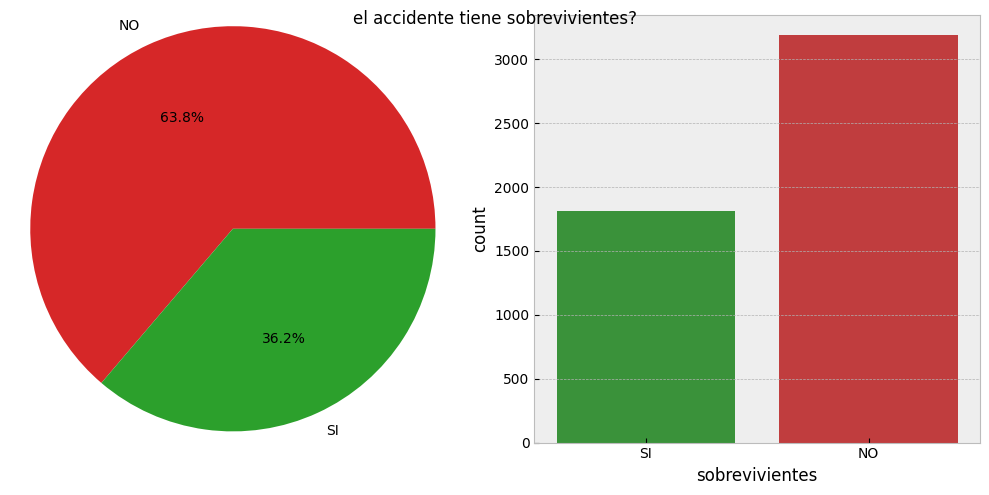

In [163]:
# Obtener el recuento de los valores 'SI' y 'NO' en la columna 'sobrevivientes'
survivors_count = df['sobrevivientes'].value_counts()

# Crear una figura y una cuadrícula de subgráficos con 1 fila y 2 columnas
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Gráfico 1: Gráfico de pastel de sobrevivientes
axs[0].pie(survivors_count, labels=survivors_count.index, autopct='%1.1f%%', colors=colors)
axs[0].axis('equal')

# Gráfico 2: Gráfico de barras de accidentes con y sin sobrevivientes
sns.countplot(data=df, x=df['sobrevivientes'], palette=['tab:green', 'tab:red'], ax=axs[1])

# Ajustar el espaciado entre subgráficos
plt.tight_layout()
fig.suptitle('el accidente tiene sobrevivientes?')

# Mostrar la figura
plt.show()


ahora vamos a analizar diferentes variables:
- muertes por modelo de avion

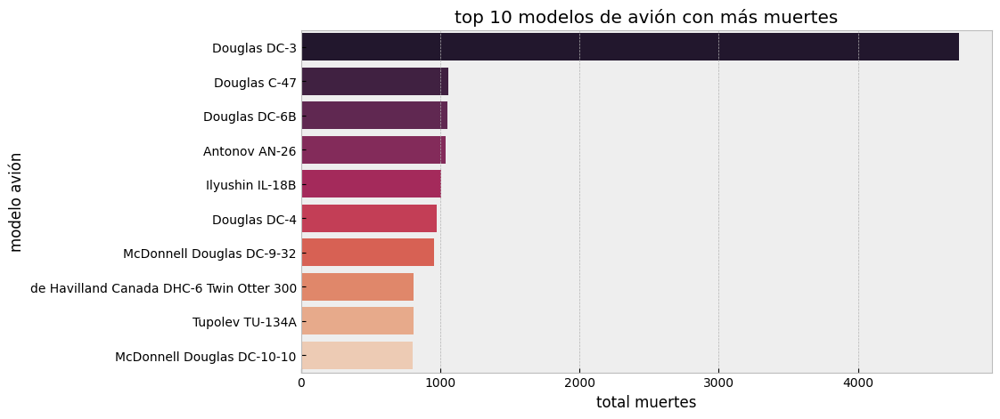

In [206]:
# vemos cual es avion con mas cantidad de muertes
df_fatal = df.groupby('ac_type')[['fatalities']].sum()
df_fatal = df_fatal.sort_values(by='fatalities', ascending=False)

df_top_10 = df_fatal.nlargest(10, 'fatalities')

plt.figure(figsize=(10, 5))
sns.barplot(y=df_top_10.index, x="fatalities", data=df_top_10, palette="rocket" )
plt.xlabel('total muertes')
plt.ylabel('modelo avión')
plt.title('top 10 modelos de avión con más muertes')
plt.show()

bien, sabemos que el DOUGLAS DC-3 supera por mucho a cualquier otra aeronave en cantidad de muertes, pero quiero ver si la cantidad de accidentes es representativa o no.

In [174]:
accidentes_por_tipo = df['ac_type'].value_counts()
accidentes_por_tipo

Douglas DC-3                                333
de Havilland Canada DHC-6 Twin Otter 300     81
Douglas C-47A                                70
Douglas C-47                                 63
Douglas DC-4                                 41
                                           ... 
Convair CV-340-59                             1
Vickers Viscount 759D                         1
H-21B                                         1
Avro 685 York C1                              1
Antonov An 26B-100                            1
Name: ac_type, Length: 2466, dtype: int64

con este dato veo que si bien el 'de Havilland Canada DHC-6 Twin Otter 300' tuvo menos fatalidades que el 'Douglas C-47' tuvo muchos más accidentes, así que voy a comparar los 3 con mayores accidentes a lo largo de los años como para evaluar su desempeńo

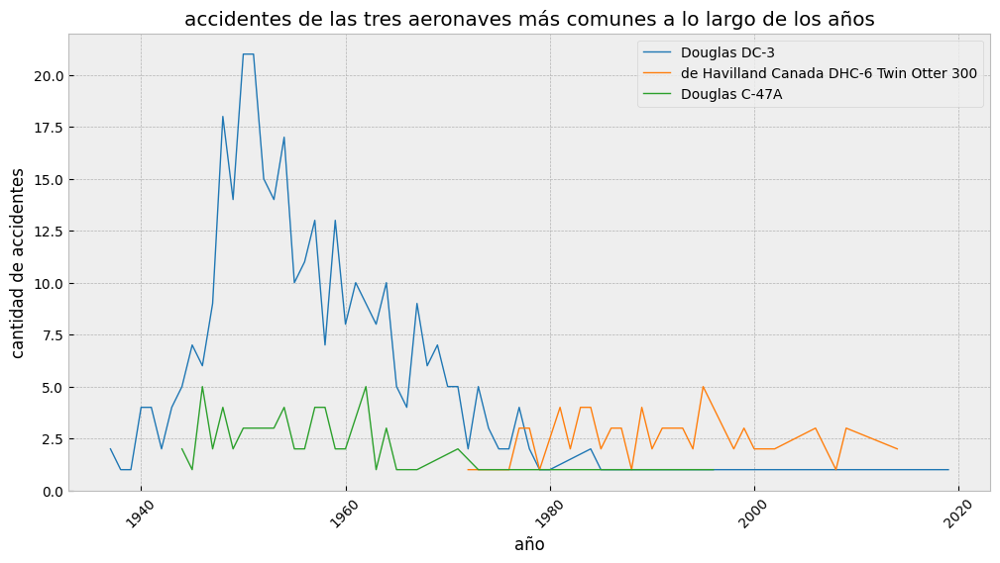

In [207]:
# Select the aircraft types with the most crashes
top_3_types = accidentes_por_tipo.nlargest(3).index

# Define los colores para cada aeronave
colors = ['tab:blue', 'tab:orange', 'tab:green']

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Iterate over the top 3 aircraft types
for i, aircraft_type in enumerate(top_3_types):
    # Filter the DataFrame for the selected aircraft type
    type_data = df[df['ac_type'] == aircraft_type].copy()

    # Group the data by year and calculate the count of crashes for each year
    crashes_by_year = type_data.groupby('anio').size()

    # Plot the number of crashes over the years
    ax.plot(crashes_by_year.index, crashes_by_year.values, linewidth=1, color=colors[i], label=aircraft_type)

# Set the labels and title
ax.set_xlabel('año')
ax.set_ylabel('cantidad de accidentes')
ax.set_title('accidentes de las tres aeronaves más comunes a lo largo de los años')

# Rotate the x-axis labels for better readability
for label in ax.xaxis.get_ticklabels():
    label.set_rotation(45)

# Add a legend
ax.legend()

# Display the plot
plt.show()


tal como mi análisis preliminar predijo, podemos ver acá como una aeronave como la DOUGLAS DC-3 comenzó a operar luego del estallido de la 2da Guerra y con el desarrollo de nuevas tecnologías y avances parece haber quedado en deshuso hacia 1980 justo cuando el de Havilland Canada DHC-6 Twin Otter 300 entra en acción, una aeronave que si bien tuvo un gran número de accidentes, está muy lejos del DOUGLAS DC-3, sus reportes parece más similar a la tercer aeronave con más accidentes: DOUGLAS C-47A. Al no tener datos concretos de la cantidad de vuelos que hacian estos aviones no podemos hablar fehacientemente de desempeño, ya que no sabemos la cantidad de vuelos por día de cada aeronave, pero si podemos decir que la cantida de accidentes del DOUGLAS DC-3 es muy superior a cualquier otra, por lo tanto no usaría dicha aeronave en la actualidad. 

- muertes por operador

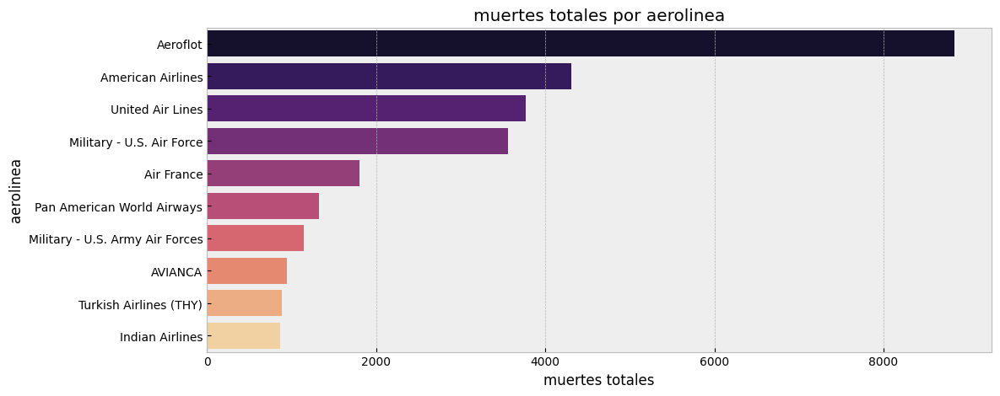

In [208]:
# vamos a ver los 10 aerolineas u operadores con más muertes
df_death_airline = df.groupby('operator')[['total_fatalities']].sum() 
df_death_airline = df_death_airline.rename(columns={"operator": "total death"})
df_death_airline = df_death_airline.sort_values(by='total_fatalities', ascending=False)
df_death_airline_top10 = df_death_airline.head(10)

plt.figure(figsize=(12, 5))
sns.barplot(y=df_death_airline_top10.index, x='total_fatalities', data=df_death_airline_top10, palette="magma")
plt.xlabel('muertes totales')
plt.ylabel('aerolinea')
plt.title('muertes totales por aerolinea')
plt.show()

es llamativa la gran diferencia entre Aeroflot y el resto de las aerolíneas, sus fatalidades duplican las de las fuerzas armadas incluso. Aeroflot es una aerolinea Rusa, por lo que vamos a investigar las locaciones de los accidentes a ver si hay algun tipo de relación. 

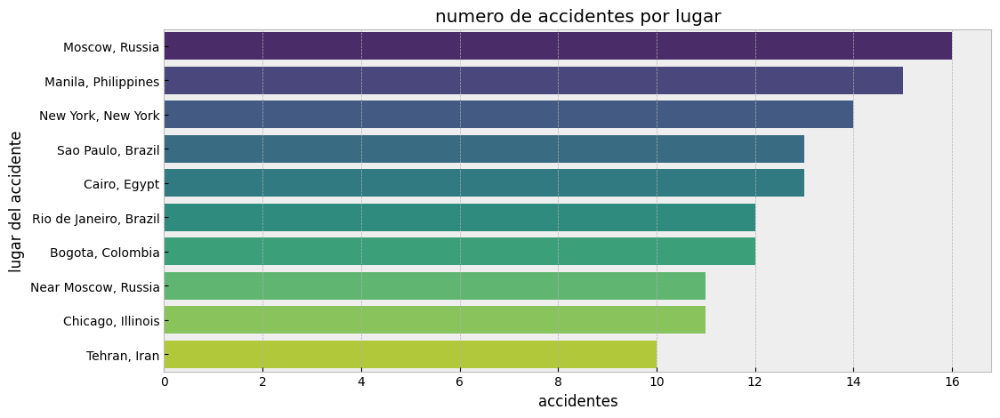

In [209]:
# ahora vamos a ver en qué lugares se produjeron la mayoria de accidentes
df_location_top_10 = df['locacion'].value_counts().head(10)
df_location_top_10 = df_location_top_10.reset_index()  # Restablecer el índice

plt.figure(figsize=(12, 5))
sns.barplot(y='index', x='locacion', data=df_location_top_10, palette="viridis")
plt.xlabel('accidentes')
plt.ylabel('lugar del accidente')
plt.title('numero de accidentes por lugar')
plt.show()

si bien coincide con el lugar donde más se registran accidentes, no por mucho. Ahora lo que quiero es tener un acercamiento a la cantida de accidentes respecto al mes y al dïa de la semana.

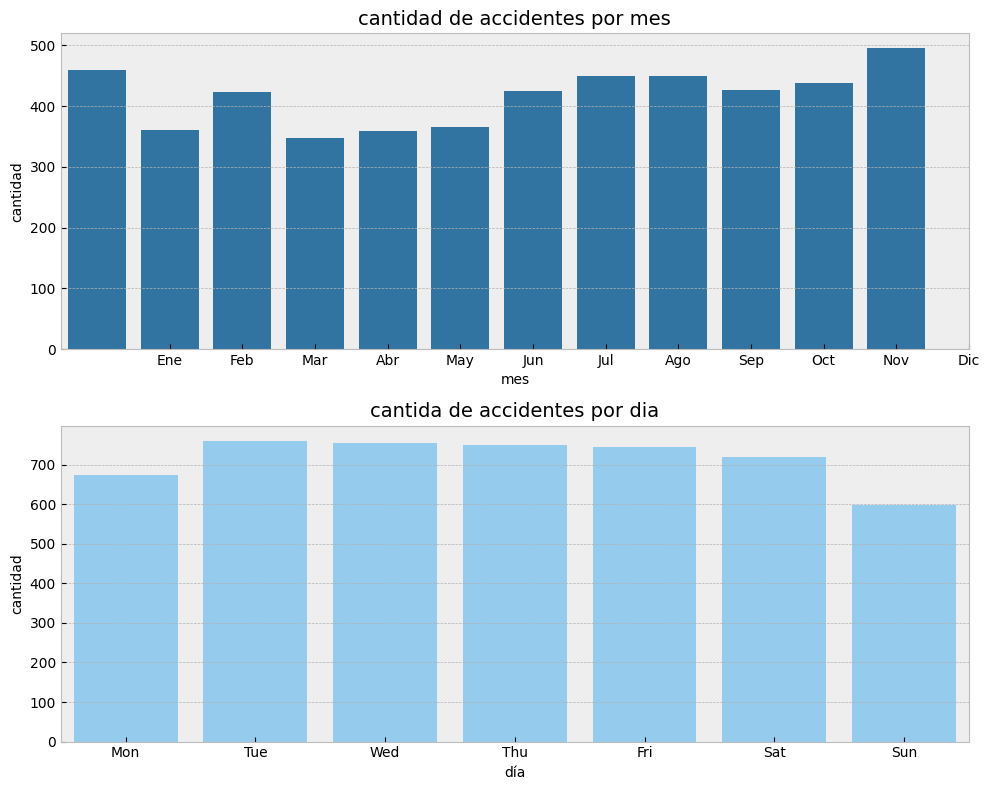

In [210]:
gs = gridspec.GridSpec(2, 2)
pl.figure(figsize=(10,8))

ax = pl.subplot(gs[0, :]) # row 0, col 0
sns.barplot(x=df.groupby(df.fecha.dt.month)[['fecha']].count().index, y=df.groupby(df.fecha.dt.month)[['fecha']].count()['fecha'], color='tab:blue')
plt.xticks(df.groupby(df.fecha.dt.month)[['fecha']].count().index, ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.xlabel('mes', fontsize=10)
plt.ylabel('cantidad', fontsize=10)
plt.title('cantidad de accidentes por mes', loc='Center', fontsize=14)

ax = pl.subplot(gs[1, :])
sns.barplot(x=df.groupby(df.fecha.dt.weekday)[['fecha']].count().index, y=df.groupby(df.fecha.dt.weekday)[['fecha']].count()['fecha'], color='lightskyblue')
plt.xticks(df.groupby(df.fecha.dt.weekday)[['fecha']].count().index, ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.xlabel('día', fontsize=10)
plt.ylabel('cantidad', fontsize=10)
plt.title('cantida de accidentes por dia', loc='Center', fontsize=14)

plt.tight_layout()
plt.show()



podemos ver que en los meses de noviembre y diciembre suelen haber más accidentes, pero claro que también suelen haber más vuelos ya que coincide con las fiestas que se festejan a nivel internacional y vacaciones. 

ahora vamos a comparar los vuelos civiles/comerciales con los militares

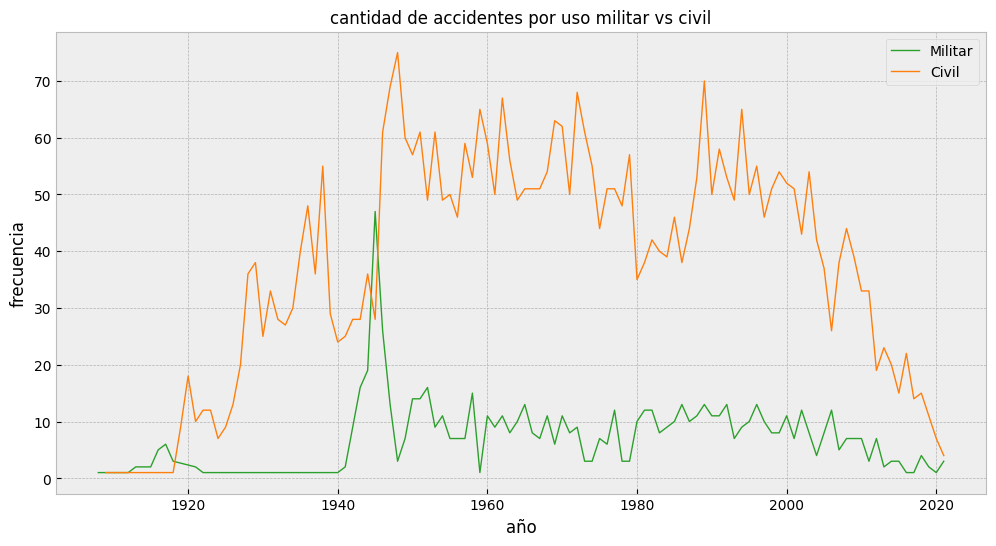

In [220]:
df_militar = df[df['operator'].str.contains('Military', regex=False)]
total_militar = df_militar['anio'].value_counts().reset_index()

df_civil = df[~df['operator'].str.contains('Military', regex=False)]
total_civil = df_civil['anio'].value_counts().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data= total_militar, x='index', y='anio', linewidth=1, color='tab:green',label='Militar')
sns.lineplot(data= total_civil, x='index', y='anio',linewidth=1, color='tab:orange',label='Civil')
plt.xlabel('año')
plt.ylabel('frecuencia')
plt.title('cantidad de accidentes por uso militar vs civil', loc='Center', fontsize=12)
plt.legend()
plt.show()

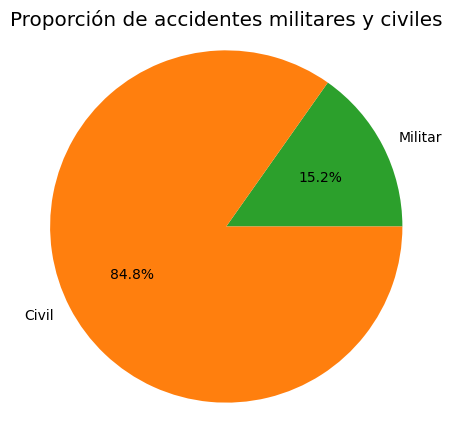

In [217]:
# Calcular la suma total de accidentes militares y civiles
total_accidentes_militar = total_militar['anio'].sum()
total_accidentes_civil = total_civil['anio'].sum()
datos = [total_accidentes_militar, total_accidentes_civil]

etiquetas = ['militar', 'civil']
colores = ['tab:green', 'tab:orange']

plt.figure(figsize=(5, 5)) # grafico de torta
plt.pie(datos, labels=etiquetas, colors=colores, autopct='%1.1f%%')
plt.title('proporción de accidentes militares y civiles')
plt.axis('equal')  # Para que el gráfico sea circular

plt.show()

Los accidentes militares son muy bajos en relación a los de pasajeros con una excepción que coincide con la 2da Guerra Mundial, lo que tiene mucho sentido. 

Vamos a comparar las muertes aereas vs en tierra:

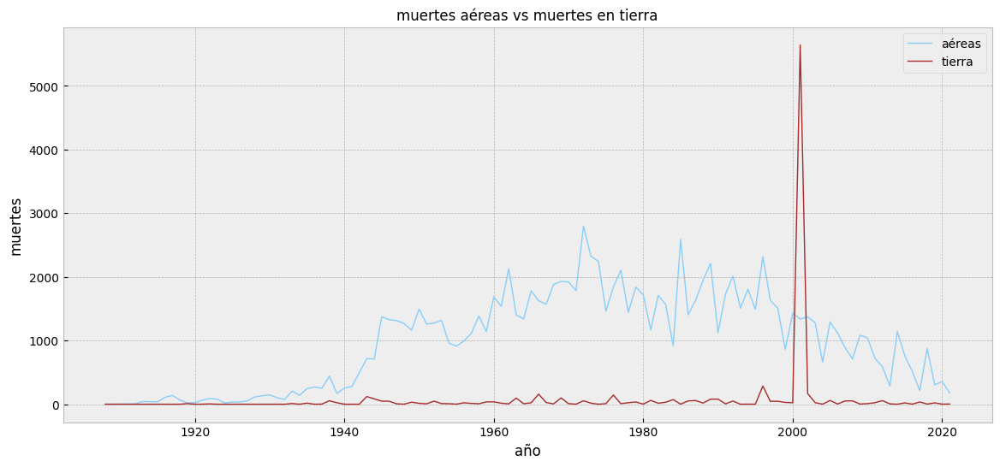

In [213]:
aereas_anio = df.groupby('anio')['fatalities'].sum().reset_index()
tierra_anio = df.groupby('anio')['ground_fatalities'].sum().reset_index()
plt.figure(figsize=(14, 6))
sns.lineplot(data = aereas_anio, x='anio', y='fatalities', linewidth=1, color='lightskyblue',label='aéreas')
sns.lineplot(data = tierra_anio, x='anio', y='ground_fatalities',linewidth=1, color='brown',label='tierra')
plt.xlabel('año')
plt.ylabel('muertes')
plt.title('muertes aéreas vs muertes en tierra', loc='Center', fontsize=12)
plt.legend()
plt.show()

Vemos que hay un pico super alto en el 2001, sabemos que es el año donde se cayeron las Torres Gemelas en USA, vamos a buscar esos datos para corroborar:

In [109]:
df[df['ground_fatalities']>1000]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,sobrevivientes,porcentaje_sobrevivientes,total_fatalities
4346,4346,2001-09-11,08:47,"New York City, New York",American Airlines,Boeing 767-223ER,92.0,81.0,11.0,92.0,81.0,11.0,2750.0,The aircraft was hijacked shortly after it lef...,2001,NO,0.0,2842.0
4347,4347,2001-09-11,09:03,"New York City, New York",United Air Lines,Boeing B-767-222,65.0,56.0,9.0,65.0,56.0,9.0,2750.0,The aircraft was hijacked shortly after it lef...,2001,NO,0.0,2815.0


Efectivamente los datos coinciden, ahora me intriga saber cuales son los accidentes con más de 500 fatalidades en el aire:

In [110]:
df[df['fatalities']>500]

,id,fecha,hora,locacion,operator,ac_type,all_aboard,passengers_aboard,crew_aboard,fatalities,passenger_fatalities,crew_fatalities,ground_fatalities,summary,anio,sobrevivientes,porcentaje_sobrevivientes,total_fatalities
2902,2902,1977-03-27,17:07,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644.0,614.0,30.0,583.0,560.0,23.0,0.0,Both aircraft were diverted to Tenerife becaus...,1977,SI,9.472050,583.0
3341,3341,1985-08-12,18:56,"Mt. Osutaka, near Ueno Village, Japan",Japan Air Lines,Boeing B-747-SR46,524.0,509.0,15.0,520.0,505.0,15.0,0.0,The aircraft suffered an aft pressure bulkhead...,1985,SI,0.763359,520.0
